# Reddit

## Project Members:
- Omar Alkhayyat (2121118117)
- Ali Behbehani (2132131280)
- Essa Alansari (2121117232)


In [1]:
import requests
import praw
import pandas as pd
import sys
import os
import numpy as np
from pandas import datetime
import altair as alt
from altair import *

In [2]:
reddit = praw.Reddit(client_id='UJ7cIcf2yoZSNg',
                    client_secret='SC1SH-Jc3dqwhjeplg8sWGqRS-g'
                    ,password='abdullah-10' ,
                    user_agent='kuwaituniversity' ,
                    username='omaralkhayyat')

Version 5.2.0 of praw is outdated. Version 5.3.0 was released Sunday December 17, 2017.


In [3]:
subriddet = reddit.subreddit('Popular')

In [4]:
authors = [x.author for x in subriddet.gilded()]

In [12]:
submission_dfs = []

for a in authors:
    # check if the csv file for the author name exists
    csv_file_name = "{}_submissions.csv".format(a.name)
    # the file exists, so lets load the csv as a dataframe
    if os.path.exists(csv_file_name):
        print("found {}, I will load the dataframe".format(csv_file_name))
        df = pd.read_csv(csv_file_name)
    else:
        print("did not find {}, loading from api".format(csv_file_name))
        
        #load submissions from reddit
        author_submissions = reddit.redditor(a.name).submissions

        # fetch the information for each submission of top 100 hot submissions
        sub_data = [
            {
                "title":x.title,
                "score":x.score,
                "num_comments":x.num_comments,
                "selftext":x.selftext,
                "ID":x.id,
                "Author":x.author.name,
                "Submission_Created":x.created_utc
            } for x in author_submissions.hot(limit=100)
        ]
        
    
        # create dataframe for the submissions of that author
        df = pd.DataFrame(sub_data)
                
        # store it, so we dont fetch it next time
        df.to_csv(csv_file_name)
    
    # add the author submission df to submission_dfs
    submission_dfs.append(df)

# loop ended, now combine all the dfs into a single df
subs_df = pd.concat(submission_dfs)

did not find jorshrod_submissions.csv, loading from api
did not find attorneyriffic_submissions.csv, loading from api
did not find MasterBac_submissions.csv, loading from api
did not find AstralWave_submissions.csv, loading from api
did not find Chinguentes_submissions.csv, loading from api
did not find gazlegeoff_submissions.csv, loading from api
did not find outer_sect_disciple_submissions.csv, loading from api
did not find Cassian_Andor_submissions.csv, loading from api
did not find boglehead28_submissions.csv, loading from api
did not find GuitarCFD_submissions.csv, loading from api
did not find Max_Trollbot__submissions.csv, loading from api
did not find bwburke94_submissions.csv, loading from api
did not find PM_Me_YourFav_Song_submissions.csv, loading from api
did not find mrmattolsen_submissions.csv, loading from api
did not find flakingnapstich_submissions.csv, loading from api
did not find DoctorWhosOnFirst_submissions.csv, loading from api
did not find Paulingtons_submission

In [13]:
subs_df.head()

,Author,ID,Submission_Created,num_comments,score,selftext,title
0,jorshrod,7l56sb,1.513811e+09,362,4804,I was having an EMG test today and started tal...,How much bandwidth does the spinal cord have?
1,jorshrod,7l4b8z,1.513803e+09,11,1,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Director's Cut, Furi, Worms W..."
2,jorshrod,7l48mr,1.513802e+09,2,1,[FIRST PAGE](https://www.reddit.com/r/IGSRep/c...,Jorshrod's IGS Rep Page 2
3,jorshrod,7kmbct,1.513615e+09,8,1,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Directors Cut, BlazBlue: Chro..."
4,jorshrod,7j47a0,1.513018e+09,4,1,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H]Wasteland 2:Director's, Furi, H1Z1, Offworl..."


In [14]:
subs_df.Submission_Created = subs_df.Submission_Created.apply(datetime.fromtimestamp)

In [27]:
subs_df.to_csv("subs_df.csv")

In [17]:
cd_data = [
   {
       "name":x.name,
       "comment_karma":x.comment_karma,
       "post_karma":x.link_karma,
       "is_gold":x.is_gold,
       "is_mod":x.is_mod,
       "ID":x.id,
       "is employee":x.is_employee,
       "is_friend":x.is_friend,
       
       
   }
       
   for x in authors]

In [18]:
cdf = pd.DataFrame(cd_data)

In [20]:
cdf.head()

,ID,comment_karma,is employee,is_friend,is_gold,is_mod,name,post_karma
0,4amx5,11338,False,False,True,False,jorshrod,9785
1,60siq,33855,False,False,True,False,attorneyriffic,903
2,mnal5,294,False,False,True,False,MasterBac,3699
3,11absx,891,False,False,True,False,AstralWave,10858
4,6k069,254,False,False,True,False,Chinguentes,8905


In [21]:
cdf.to_csv("cdf.csv")

In [26]:
cdf

,Created,ID,comment_karma,is employee,is_friend,is_gold,is_mod,name,post_karma
0,2011-04-12 05:28:43,53a1t,51482,False,False,True,False,Strid3r21,55980
1,2013-09-01 08:23:27,cyv1d,34593,False,False,True,False,Phineasfogg,34
2,2016-12-02 15:47:04,1397sf,10260,False,False,True,False,SoWhatDidIMiss,1114
3,2015-05-10 15:45:38,ne42w,32449,False,False,True,True,Baz-Ravish,8148
4,2008-02-13 18:59:48,3370f,20585,False,False,True,False,papercup,13
5,2013-07-06 00:35:06,c9xtv,5461,False,False,True,False,runedrune,2685
6,2016-07-16 09:10:54,zjlzm,1825,False,False,True,False,theboredlockpicker,3219
7,2017-07-11 01:44:50,6ot8gst,1788,False,False,True,True,antonfabijan,10074
8,2016-07-14 21:08:03,zi9rv,9126,False,False,True,False,JamieBGood1,501
9,2012-03-15 17:42:23,76fd9,59351,False,False,True,True,Pyrolytic,10678


In [22]:
final_df = cdf.merge(subs_df, how="outer", left_on="name", right_on="Author")

In [23]:
final_df

,ID_x,comment_karma,is employee,is_friend,is_gold,is_mod,name,post_karma,Author,ID_y,Submission_Created,num_comments,score,selftext,title
0,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7l56sb,2017-12-21 02:01:29,362.0,4804.0,I was having an EMG test today and started tal...,How much bandwidth does the spinal cord have?
1,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7l4b8z,2017-12-20 23:51:33,11.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Director's Cut, Furi, Worms W..."
2,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7l48mr,2017-12-20 23:41:24,2.0,1.0,[FIRST PAGE](https://www.reddit.com/r/IGSRep/c...,Jorshrod's IGS Rep Page 2
3,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7kmbct,2017-12-18 19:36:24,8.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Directors Cut, BlazBlue: Chro..."
4,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7j47a0,2017-12-11 21:38:34,4.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H]Wasteland 2:Director's, Furi, H1Z1, Offworl..."
5,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7i9nqu,2017-12-08 00:14:56,0.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Directors Cut, Furi, Sexy Bru..."
6,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7i8pny,2017-12-07 21:54:22,1.0,0.0,[removed],When does the season review come out? Did I mi...
7,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7hw45q,2017-12-06 08:58:53,3.0,29.0,I've been reflecting this week on the differen...,"34 weeks gone for #3, still doesn't feel real!"
8,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7hvmn2,2017-12-06 07:23:00,13.0,0.0,"I'm wanting to buy the Revan Reborn set, but o...",Best way to turn Cartel coins into Credits?
9,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7htsok,2017-12-06 02:27:33,12.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Director's Cut, Furi, H1Z1, O..."


In [44]:
final_df.to_csv("final_df.csv")

In [46]:
fdf = pd.read_csv("final_df.csv")

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xe0 in position 8: invalid continuation byte

In [4]:
fdf

,Unnamed: 0,ID_x,comment_karma,is employee,is_friend,is_gold,is_mod,name,post_karma,Author,ID_y,Submission_Created,num_comments,score,selftext,title
0,0,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7l56sb,2017-12-21 02:01:29,362.0,4804.0,I was having an EMG test today and started tal...,How much bandwidth does the spinal cord have?
1,1,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7l4b8z,2017-12-20 23:51:33,11.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Director's Cut, Furi, Worms W..."
2,2,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7l48mr,2017-12-20 23:41:24,2.0,1.0,[FIRST PAGE](https://www.reddit.com/r/IGSRep/c...,Jorshrod's IGS Rep Page 2
3,3,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7kmbct,2017-12-18 19:36:24,8.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Directors Cut, BlazBlue: Chro..."
4,4,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7j47a0,2017-12-11 21:38:34,4.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H]Wasteland 2:Director's, Furi, H1Z1, Offworl..."
5,5,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7i9nqu,2017-12-08 00:14:56,0.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Directors Cut, Furi, Sexy Bru..."
6,6,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7i8pny,2017-12-07 21:54:22,1.0,0.0,[removed],When does the season review come out? Did I mi...
7,7,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7hw45q,2017-12-06 08:58:53,3.0,29.0,I've been reflecting this week on the differen...,"34 weeks gone for #3, still doesn't feel real!"
8,8,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7hvmn2,2017-12-06 07:23:00,13.0,0.0,"I'm wanting to buy the Revan Reborn set, but o...",Best way to turn Cartel coins into Credits?
9,9,4amx5,11338,False,False,True,False,jorshrod,9785,jorshrod,7htsok,2017-12-06 02:27:33,12.0,1.0,[My IGS REP](https://www.reddit.com/r/IGSRep/c...,"[H] Wasteland 2: Director's Cut, Furi, H1Z1, O..."


In [3]:
fdf["Total_score"]= fdf.groupby("name").transform(np.sum).score
fdf["Total_num_comments"]= fdf.groupby("name").transform(np.sum).num_comments

In [9]:
fdf.dtypes

Unnamed: 0              int64
ID_x                   object
comment_karma           int64
is employee              bool
is_friend                bool
is_gold                  bool
is_mod                   bool
name                   object
post_karma              int64
Author                 object
ID_y                   object
Submission_Created     object
num_comments          float64
score                 float64
selftext               object
title                  object
Total_score           float64
Total_num_comments    float64
dtype: object

In [4]:
test = fdf.sample(3000)

In [42]:
test

,Unnamed: 0,ID_x,comment_karma,is employee,is_friend,is_gold,is_mod,name,post_karma,Author,ID_y,Submission_Created,num_comments,score,selftext,title,Total_score,Total_num_comments
4369,4369,702ov,16072,False,False,True,False,headoverheals,2058,headoverheals,79526i,2017-10-27 21:26:11,5.0,10.0,NaN,The Forum Poll™ - PC lead in Ontario Solid,1766.0,1466.0
3006,3006,81bjr,20705,False,False,True,True,MaceWumpus,470,MaceWumpus,181cpw,2013-02-07 04:41:24,5.0,2.0,"Obviously, if you want to study Kant, you shou...",Languages for graduate level philosophical study?,2198.0,1305.0
5020,5020,fxvfr,324627,False,False,True,True,ALLSTARTRIPOD,1021,ALLSTARTRIPOD,4oda4c,2016-06-16 16:22:08,713.0,9859.0,I am the commanding officer for a small band o...,TIFU by accidentally sending one of my soldier...,11313.0,889.0
3036,3036,ep4r2,31729,False,False,True,False,Egon_1,140087,Egon_1,7kkl20,2017-12-18 14:11:42,168.0,224.0,NaN,"A Devastating ING Report about Bitcoin Core: ""...",12640.0,3677.0
4364,4364,9xgkiz3,28164,False,False,True,True,Woofers_MacBarkFloof,5719,Woofers_MacBarkFloof,6zz5hv,2017-09-14 04:33:27,1.0,9.0,NaN,Gimme that yarba,6181.0,1067.0
3097,3097,ep4r2,31729,False,False,True,False,Egon_1,140087,Egon_1,7hsuyb,2017-12-06 00:14:30,11.0,113.0,NaN,"Vinny Lingham: ""Mission Accomplished: I finall...",12640.0,3677.0
5069,5069,b4m9h,64646,False,False,True,False,Timbitkiller,4099,Timbitkiller,4nnxe2,2016-06-12 02:59:33,4.0,1.0,NaN,Eunicid Worm? This scary duder steals food fro...,3415.0,847.0
2655,2655,4x68b,526856,False,False,True,False,zazzlekdazzle,38177,zazzlekdazzle,5ugv2q,2017-02-16 21:31:09,523.0,14992.0,NaN,Kiss cam mistake at the Pro Bowl,91952.0,4140.0
1898,1898,4hukh,82632,False,False,True,False,MarbledNightmare,52068,MarbledNightmare,6yz1xo,2017-09-09 04:33:25,10.0,47.0,NaN,The Women of Tiger Muay Thai,18049.0,5365.0
3927,3927,17ed7y,106667,False,False,True,False,dust_wind,16930,dust_wind,7a46w6,2017-11-01 18:12:58,8.0,0.0,NaN,When a right wing nut drove into a group of le...,61913.0,4599.0


In [6]:
str(test.Submission_Created)
test.dtypes

Unnamed: 0              int64
ID_x                   object
comment_karma           int64
is employee              bool
is_friend                bool
is_gold                  bool
is_mod                   bool
name                   object
post_karma              int64
Author                 object
ID_y                   object
Submission_Created     object
num_comments          float64
score                 float64
selftext               object
title                  object
Total_score           float64
Total_num_comments    float64
dtype: object

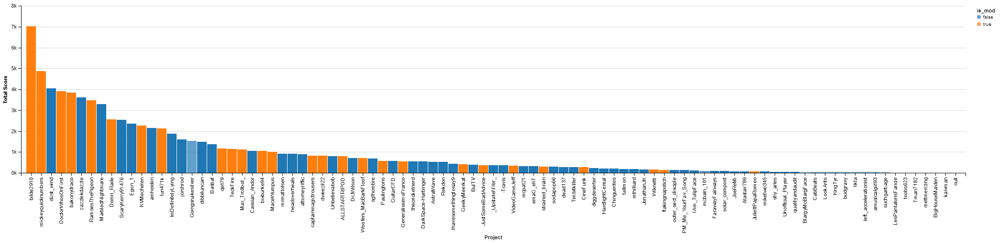

In [58]:
Chart(fdf).mark_bar().encode(
    x=X('Author:O', sort=SortField(field='Total_num_comments', order='descending', op='max'),
        axis=Axis(title='Project')),
    y=Y('Total_num_comments:Q',
        axis=Axis(title='Total Score')),
    color ="is_mod"
        )
#we got our top 10 Authers from here.

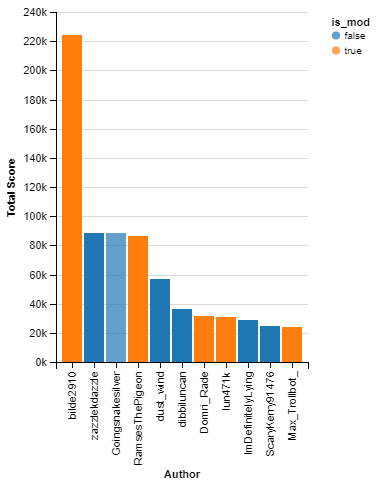

In [47]:
Chart(fdf.nlargest(440,"Total_score")).mark_bar().encode(
    x=X('Author:O', sort=SortField(field='Total_score', order='descending', op='max'),
        axis=Axis(title='Author')),
    y=Y('Total_score:Q',
        axis=Axis(title='Total Score')),
    color ="is_mod"
        )
#Being a moderator or not doesn't make a diffirence in total score.
#Number in highest total score is a moderator named (bilde2910)

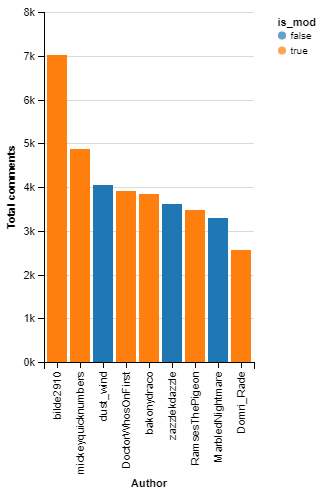

In [48]:
Chart(fdf.nlargest(480,"Total_num_comments")).mark_bar().encode(
    x=X('Author:O', sort=SortField(field='Total_num_comments', order='descending', op='max'),
        axis=Axis(title='Author')),
    y=Y('Total_num_comments:Q',
        axis=Axis(title='Total comments')),
    color ="is_mod"
        )
#We can see that the user (bilde2910) has the highest number of comments as well as the previous chart which he got the highets
#total score, which means that he is the most active user in our sample.
#we can also conclude that moderators got more comments than non-moderators.

In [18]:
fdf = final_df.sample(3000)

In [4]:
final_df=pd.read_csv('final_df.csv')

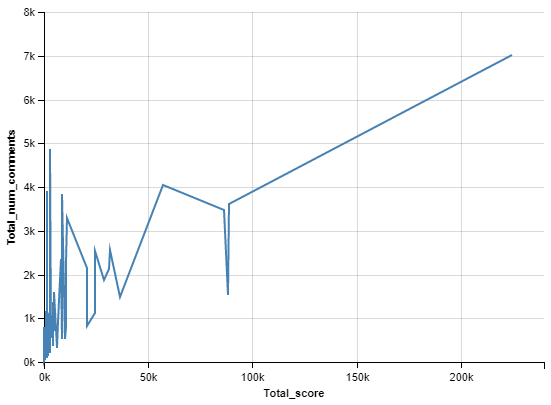

In [57]:
alt.Chart(fdf).mark_line().encode(x='Total_score',y='Total_num_comments')
#number of comments and score goes side to side with Total score reaches 80k.

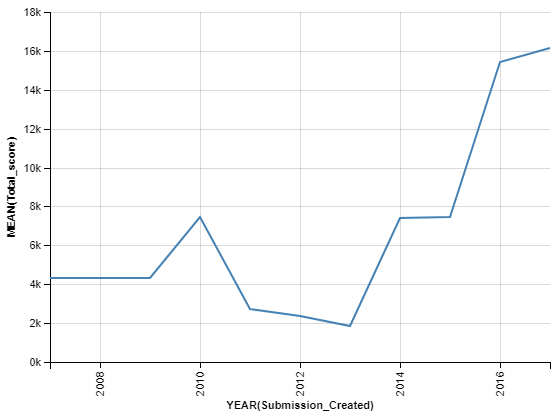

In [31]:
alt.Chart(fdf).mark_line().encode(
    y='mean(Total_score)',
    x=alt.X('Submission_Created:T', timeUnit='year'),
)
#since 2013 the total score has been increasing.
#further invistigation to see why it droppd on 2010.

In [19]:
fdf["Total_score"]= fdf.groupby("name").transform(np.sum).score
fdf["Total_num_comments"]= fdf.groupby("name").transform(np.sum).num_comments

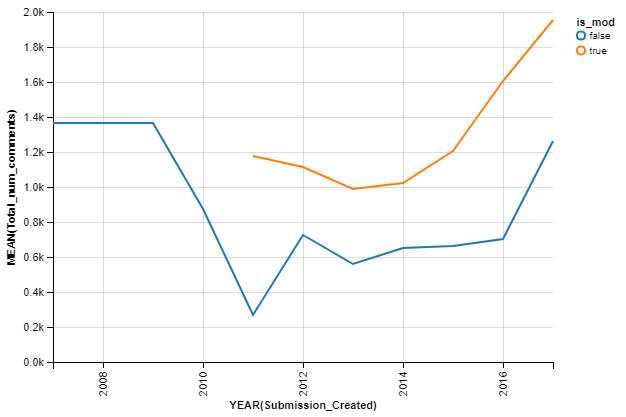

In [38]:
alt.Chart(fdf).mark_line().encode(
    y='mean(Total_num_comments)',
    x=alt.X('Submission_Created:T', timeUnit='year'),
    color='is_mod',
)


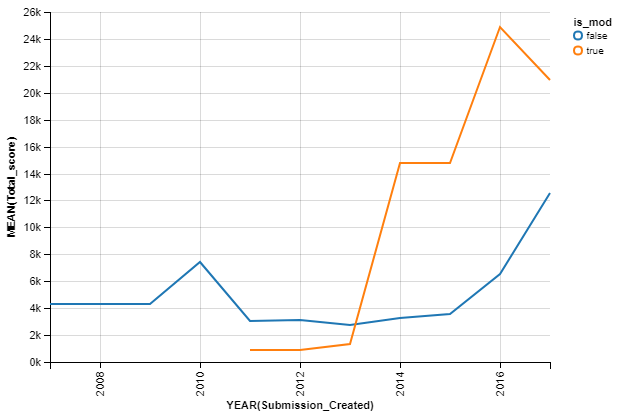

In [39]:
alt.Chart(fdf).mark_line().encode(
    y='mean(Total_score)',
    x=alt.X('Submission_Created:T', timeUnit='year'),
    color='is_mod',
)
#In 2013 Reddit introduces two kinds of moderators: those with full permissions, and those with limited permissions. 
#So the number of moderators increased since then and the website got more active.

In [55]:
fdf.head()

,Unnamed: 0,ID_x,comment_karma,is employee,is_friend,is_gold,is_mod,name,post_karma,Author,ID_y,Submission_Created,num_comments,score,selftext,title,Total_score,Total_num_comments
1209,1209,dalvl,88257,False,False,True,False,Rekdon,55129,Rekdon,76cjjr,2017-10-14 17:55:00,8.0,2.0,NaN,"What is your ""I need my coffee in the morning""...",8580.0,515.0
2673,2673,4x68b,526856,False,False,True,False,zazzlekdazzle,38177,zazzlekdazzle,57bd5k,2016-10-13 20:06:41,275.0,629.0,NaN,How Video Games Are Changing the Way Soccer is...,88603.0,3602.0
2274,2274,6zykq,20812,False,False,True,False,DrJWilson,2811,DrJWilson,7c9caa,2017-11-11 19:32:57,3.0,19.0,NaN,Writing about Place: The Bustling City Setting...,2186.0,716.0
4731,4731,j8ikd,63272,False,False,True,False,ScaryKerry91476,23141,ScaryKerry91476,6z4wir,2017-09-10 02:11:31,201.0,1634.0,So. Yesterday was supposed to be the day. We w...,A Mommy Fearest update - Is it possible that a...,24554.0,2548.0
5231,5231,bbuks,44880,False,False,True,True,bilde2910,118898,bilde2910,4ji5rm,2016-05-16 00:47:32,0.0,5.0,NaN,Trailer driving through frozen wastelands,224419.0,7012.0
